# Assignment 4 Reinforcement Learning
    Name: Gokul Nithin Kumar Rajakumar
    Student ID: 801082252

#  I. Overview
    The objective of this assignment is to run the BlackJack game using an agent instead of the player using Reinforcement Learning. The Temporal Difference Learning approach used here is Q learning which will be discussed in detail below.

# II. Problems 



## Blackjack

<img src="https://upload.wikimedia.org/wikipedia/commons/a/a2/Blackjack_game_1.JPG" width=800 />


### <font color="red"> Game Introduction and Rules: </font>


    Blackjack is a card game where the goal is to obtain cards that sum to as near as possible to 21 without going over. They're playing against a fixed dealer.

    Face cards (Jack, Queen, King) have point value 10.Aces can either count as 11 or 1, and it's called 'usable' at 11. This game is placed with an infinite deck (or with replacement).

    The game starts with each player getting two face up cards and dealer having one face up and face down card and the player needs to bet an amount of money within range of 1 to max bet (10). Note: Face up means that you will know what the card is. The player can request additional cards (hit=1) until they decide to stop (stick=0) or exceed 21 (bust).

    After the player sticks, the dealer reveals their facedown card, and draws until their sum is 17 or greater (fixed policy).  If the dealer goes bust the player wins. You won't see the dealer's facedown card, just you will know if you have or lost and you will get appropriate reward of +1 if you win, -1 if you loose or 0 if the match is drawn. (It is freedom of choice for you to change the reward function. If you want to change, you should explain the reason of the change.)

    If the player wins, the amount he has bet will be doubled and given back. If the player and dealer have the same sum, then its a draw and the player will get back the money he has bet. If the player loses then, the money he bet will be lost. If neither player nor dealer busts, the outcome (win, lose, draw) is decided by whose sum is closer to 21. You are free to change the reward function to make it learn more efficiently. (i.e.,  the amount of money the user is winning after each round). 

    Regardless of the number of players on the table, each player will be just playing against the dealer independently of the other players.

## BlackJack Environment

In [1]:
import collections
import numpy as np
import matplotlib.pyplot as plt
import gym
from gym import spaces
from gym.utils import seeding
%matplotlib inline

### Player class definition

    This class creates an object(Player details) [1] for each BlackJack player with a distinct name. The Player Details contains three attributes namely-
          1. Player's name
          2. Current cards in hand
          3. Total balance left to play games  
    
    So in our agent we shall call this fuction as-
        player = Player("gokul", start_balance = 10)
            which means that player object is created with player name "gokul" and with a start balance of 10.
        
   ##### Methods used-
        __init__() initialises the player
        recharge_account() recharges the player balance to starter balance.
        get_info() is getter method that prints out all three attributes.

In [2]:
class Player():
    def __init__(self, player_name, start_balance = 10):
        self.player_name = player_name
        self.card = []
        self.starter_balance = start_balance
        self.total_balance = start_balance

    def recharge_account(self):
        self.total_balance = self.starter_balance
        
    def get_info(self):
        print("Player name: {}".format(self.player_name))
        print("Player card: {}".format(self.card))
        print("Player total_balance: {}".format(self.total_balance))    

In [3]:
# 1 = Ace, 2-10 = Number cards, Jack/Queen/King = 10
deck = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 10, 10, 10]

def cmp(a, b):
    return float(a > b) - float(a < b)

def draw_card(np_random):
    return int(np_random.choice(deck))

def draw_hand(np_random):
    return [draw_card(np_random), draw_card(np_random)]


def usable_ace(hand):  
    return 1 in hand and sum(hand) + 10 <= 21


def sum_hand(hand):  
    if usable_ace(hand):
        return sum(hand) + 10
    return sum(hand)


def is_bust(hand):  
    return sum_hand(hand) > 21


def score(hand):  
    return 0 if is_bust(hand) else sum_hand(hand)


def is_natural(hand): 
    return sorted(hand) == [1, 10]

    The Black Jack Environment has the following method-
        1. __init__()- for initializing the game environment
        2. add_player()- call the player class to create a player object
        3. seed()- Seed intilizes the state of a pseudo random number generator so that we will get exactly the same pattern of numbers.
        4. step()- In this method two types of actions (hit and stick) are handled. Hit means player takes a new card. If it bust then come out else continue. Stick means play out the dealers hand ie. the dealer takes card untill the sum is > 17. If dealer is bust then player wins else calculate player and dealer score and the one with the highest score wins.
        5. _get_obs()- returns player and dealer info.
        6. get_player_obs()- returns player info.
        7. get_valid_bet_amount()- returns the maximum betting amount that is valid else finish the game due to debt.
        8. init_round()-  Starts the game by allowing the dealer and player to take a card and reutn the state.
        9. bet_money()- the bet money is removed from the total balance.
        10. settle_balance()- settles the balance as soon as the the game is over. If the player wins he gets the double the betting money and that adds to his total balance. If the game is draw the player gets back his betting money. If the player loses then the balance remains the same ie the player loses his betting money.
        11. reset()- To reset the game environment.

In [4]:

class BlackjackEnv(gym.Env):
    
    def __init__(self, natural=False):
        self.action_space = spaces.Discrete(2)
        self.observation_space = spaces.Tuple((spaces.Discrete(32),spaces.Discrete(11),spaces.Discrete(2)))
        self.seed()
        self.total_players = 1
        self.players = {}
        self.natural = natural
        self.dealer = []
        self.round_bet_info = {}
        self.max_bet_cap = 10

    def add_player(self, player_class):
        if player_class not in self.players and len(self.players) < self.total_players:
            self.players[player_class.player_name] = player_class
        else:
            raise Exception("Maximum number of player allowed: {}. You can increase the player count while initializing the environment".format(len(self.players)))

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def step(self, player_name, action):
        assert self.action_space.contains(action)
        if action: 
            self.players[player_name].card.append(draw_card(self.np_random))
            if is_bust(self.players[player_name].card):
                done = True
                reward = -1
            else:
                done = False
                reward = 0
        else:  
            done = True
            while sum_hand(self.dealer) < 17:
                self.dealer.append(draw_card(self.np_random))
            reward = cmp(score(self.players[player_name].card), score(self.dealer))
            if self.natural and is_natural(self.players[player_name].card) and reward == 1:
                reward = 1.5
        if done:
            self.settle_balance(int(reward), player_name)
        return {'state':self._get_obs(player_name), 'reward': reward, 'is_round_done': done}

    def _get_obs(self, player_name):
        return {'player_info':self.get_player_obs(player_name), 
                'dealer_info': self.dealer[0]}

    def get_player_obs(self, player_name):
        return {'player_sum_card':sum_hand(self.players[player_name].card), 
                'player_card':self.players[player_name].card, 
                'player_total_balance':self.players[player_name].total_balance, 
                'usable_ace' : usable_ace(self.players[player_name].card)}
    
    def get_valid_bet_amount(self, player_name):
        print("player name: {} money left: {}".format(player_name, self.players[player_name].total_balance))
        if self.players[player_name].total_balance < 1:
            return {'is_round_done': True, 'valid_bet_amount': -1}
        max_bet_upper_limit = self.players[player_name].total_balance
        if self.players[player_name].total_balance >= self.max_bet_cap:
            max_bet_upper_limit = self.max_bet_cap            
        return {'is_round_done': False, 'valid_bet_amount': list(range(1, max_bet_upper_limit+1))}
            
    def init_round(self, player_name):         
        self.dealer = draw_hand(self.np_random)
        self.players[player_name].card = draw_hand(self.np_random)
        return {'state': self._get_obs(player_name)}        

    def bet_money(self, player_name, bet_amount):
        self.players[player_name].total_balance -= bet_amount
        self.round_bet_info[player_name] = bet_amount
            
    def settle_balance(self, is_winner, player_name):
        if is_winner == 1:
            print("Player winner")
            self.players[player_name].total_balance += (2 * self.round_bet_info[player_name])
        elif is_winner == 0:
            print("Draw match")
            self.players[player_name].total_balance += self.round_bet_info[player_name]
        else:
            print("Player lost")
    
    def reset(self, natural=False):
        for player_name, player_class in self.players.items():
            player_class.recharge_account()
        self.natural = natural
        self.dealer = []
        self.round_bet_info = {}

# III. Methods
    The TD learning approach used here is Q learning.[3] In Q learning there is a function called the Q-function uses the Bellman equation and takes two inputs: state (s) and action (a).

   <img src="https://cdn-images-1.medium.com/max/1600/1*trCNkfvyNnokeKhYUlJxfg.png" />
   
    Using the above function, we get the values of Q for the cells in the table.
    
#### SARSA-
        SARSA stands for state-action-reward-state-action[4].It is an algorithm for learning a MDP policy, used in the reinforcement learning area of machine learning. This name simply reflects the fact that the main function for updating the Q-value depends on the current state of the agent "S1", the action the agent chooses "A1", the reward "R" the agent gets for choosing this action, the state "S2" that the agent enters after taking that action, and finally the next action "A2" the agent choose in its new state. The acronym for the quintuple (st, at, rt, st+1, at+1) is SARSA.
    
#### Function Approximation-
        Q learning does work with function approximation method. But the update rule is to take the gradient respect to the weight. In the basic TD learning framework, the target is "MAX", I assumed that it is optimal, but the thing to note that the target is dependent on the theta variable. We should not only change the table entry but the whole parameter theta value, because it can be a vector or matrix, or set of vector and matrix.
    
#### Why Q learning and why not SARSA?
        In Q learning, you update the estimate from the maximum estimate of possible next actions[2], regardless of which action you took. Whereas in SARSA, you update estimates based on and take the same action. Q-learning directly learns the optimal policy, whereas SARSA learns a near-optimal policy whilst exploring.
   


# Q Learning
        The parameters used for this learning agent are-
            1. Q- Q-table which will be a dictionary of tuples
            2. epsilon- Random exploration factor
            3. alpha- Learning factor
            4. gamma- Discount factor. If it is closer to 1 learns well into distant future
            
        Here epsilon will reduce linearly until it reaches 0 based on num_episodes_to_train. Epsilon drops to 90% of its inital value in the first 30% of num_episodes_to_train. Epsilon then drops to 10% of its initial value in the next 40% of num_episodes_to_train. Epsilon finally becomes 0 in the final 30% of num_episodes_to_train
        Methods in RLAgent class-
            1. update_parameters()- Update epsilon and alpha after each action. Set them to 0 if not learning
            2. create_Q_if_new_observation()- Set intial Q values to 0.0 if observation not already in Q table.
            3. get_maxQ()- Called when the agent is asked to find the maximum Q-value of all actions based on the 'observation' the environment is in.
            4. choose_action()- Choose which action to take, based on the observation. If observation is seen for the first time, initialize its Q values to 0.0
            5. learn()- Called after the agent completes an action and receives an award. This unction does not consider future rewards then conducting learning.

In [5]:
import random

class RLAgent():
    def __init__(self, env, epsilon=1.0, alpha=0.5, gamma=0.9, num_episodes_to_train=30000):
        self.env = env

        self.valid_actions = list(range(self.env.action_space.n))

        self.Q = dict()          
        self.epsilon = epsilon   
        self.alpha = alpha       
        self.gamma = gamma       

        self.num_episodes_to_train = num_episodes_to_train 
        self.small_decrement = (0.1 * epsilon) / (0.3 * num_episodes_to_train) 
        self.big_decrement = (0.8 * epsilon) / (0.4 * num_episodes_to_train) 

        self.num_episodes_to_train_left = num_episodes_to_train

    def update_parameters(self):
        if self.num_episodes_to_train_left > 0.7 * self.num_episodes_to_train:
            self.epsilon -= self.small_decrement
        elif self.num_episodes_to_train_left > 0.3 * self.num_episodes_to_train:
            self.epsilon -= self.big_decrement
        elif self.num_episodes_to_train_left > 0:
            self.epsilon -= self.small_decrement
        else:
            self.epsilon = 0.0
            self.alpha = 0.0

        self.num_episodes_to_train_left -= 1

    def create_Q_if_new_observation(self, observation):
        if observation not in self.Q:
            self.Q[observation] = dict((action, 0.0) for action in self.valid_actions)

    def get_maxQ(self, observation):
        self.create_Q_if_new_observation(observation)
        return max(self.Q[observation].values())

    def choose_action(self, observation):
        self.create_Q_if_new_observation(observation)
        if random.random() > self.epsilon:
            maxQ = self.get_maxQ(observation)
            action = random.choice([k for k in self.Q[observation].keys()
                                    if self.Q[observation][k] == maxQ])
        else:
            action = random.choice(self.valid_actions)
            
        self.update_parameters()
        return action


    def learn(self, observation, action, reward, next_observation):
        self.Q[observation][action] += self.alpha * (reward+ (self.gamma * self.get_maxQ(next_observation))- self.Q[observation][action])

In [6]:
import gym
import matplotlib.pyplot as plt
from gym import wrappers

class Training_Agent:
    def Train(self,epsilon=0.0,alpha=0.0,gamma=0.0):
        env = BlackjackEnv()
        player1 = Player('gokul')
        env.add_player(player1)

        num_rounds = 50 
        num_samples = 100 


        num_episodes_values = range(200, 2200, 200)

        plt.figure(num=None, figsize=(16, 12))
        plt.clf()
        
        for num_episodes_value in num_episodes_values:
            total_payout = 0 
            average_payouts = [] 
            agent = RLAgent(env=env, epsilon=epsilon, alpha=alpha, gamma=gamma, num_episodes_to_train=num_episodes_value)
            env.reset()
            observation = env.init_round(player1.player_name)
            random_bet = np.random.choice(observation['state']['player_info']['player_total_balance'])
            env.bet_money(player1.player_name, random_bet)
            observation = observation['state']
            observation = (observation['player_info']['player_sum_card'] ,observation['player_info']['player_total_balance'], observation['player_info']['usable_ace'],random_bet,observation['dealer_info'])
            for sample in range(num_samples):
                round = 1

                while round <= num_rounds:
                    action = agent.choose_action(observation)
                    dd = env.step(player1.player_name,action)
                    tempNextObservation = dd['state']
                    next_observation = (tempNextObservation['player_info']['player_sum_card'] ,tempNextObservation['player_info']['player_total_balance'], tempNextObservation['player_info']['usable_ace'],random_bet,tempNextObservation['dealer_info'])
                    payout = dd['reward']
                    is_done = dd['is_round_done']
                    agent.learn(observation, action, payout, next_observation)
                    total_payout += payout
                    observation = next_observation
                    if is_done:
                        env.reset()
                        observation = env.init_round(player1.player_name)
                        random_bet = np.random.choice(observation['state']['player_info']['player_total_balance'])
                        env.bet_money(player1.player_name, random_bet)
                        observation = observation['state']
                        observation = (observation['player_info']['player_sum_card'] ,observation['player_info']['player_total_balance'], observation['player_info']['usable_ace'],random_bet,observation['dealer_info'])
                        round += 1
                        average_payouts.append(total_payout/(sample*num_rounds + round))

            plt.plot(average_payouts)
            print ("Average payout after {} rounds after training for {} episodes is {}".format(num_rounds, num_episodes_value, total_payout/(num_samples)))


        
        plt.xlabel('num_episodes')
        plt.ylabel('payout')
        plt.legend(["{}".format(i) for i in num_episodes_values], loc='upper left')
        plt.ylim(-0.5,0) # To zoom into this region
        plt.show()
        env.close()
        return agent

# Testing
    First check if you have enough money left in the account to bet, if not break and start a new game. Then get the observations i.e state and use it to decide how much you want to bet. If you have just 1 dollar left in the bank, you have no choice but to bet that amount and hopefully leave it to the fate for your agent to win and continue playing or just start a new game. Then cosider the state of the game and select the action using the RLAgent.
    Call the step function to take action on the selected action ie. whether hit or stick. The game continues untill the action is stand. Once the round is over if you have balance left the game continues untill your there is NIL balance.

In [7]:
class play:
    def gameplay(self, _agent):
        env = BlackjackEnv()
        player1 = Player('gokul')
        env.add_player(player1)
        #Number of games
        number_of_games = 100

        #Number of rounds
        number_of_rounds = 10
        counter=0
        for _game in range(number_of_games):

            env.reset()
            print("-"* 50)
            print("Game Number: {}".format(_game + 1))
            print("-"* 50)

            for _round in range(number_of_rounds): 
                print("%"* 50)
                print("Game Number: {} Round Number: {}".format(_game+1, _round+1))
                print("%"* 50)

                valid_bet_flag = env.get_valid_bet_amount(player1.player_name)
                if valid_bet_flag['is_round_done']:
                    print("You are out of money ! Will go to next game !!")
                    break
                bet_amount = valid_bet_flag['valid_bet_amount']

                round_obs = env.init_round(player1.player_name)
                print("Initial state: {}".format(round_obs))  

                if len(bet_amount) == 1 and bet_amount[0] == 1:
                    print("You can only bet 1. So betting only 1.")
                    random_bet = 1
                else:
                    random_bet = np.random.choice(bet_amount)
                print("Random Init Bet: {}".format(random_bet))
                env.bet_money(player1.player_name, random_bet)
                
                random_action = np.random.randint(0, 2)
                observation = round_obs['state']
                observation = (observation['player_info']['player_sum_card'] ,observation['player_info']['player_total_balance'], observation['player_info']['usable_ace'],random_bet,observation['dealer_info'])
                random_action = _agent.choose_action(observation)
                

                print("Action taken: {}".format(random_action))

                round_obs = env.step(player1.player_name, random_action)
                print("State after 1st action: {}".format(round_obs))

                while not round_obs['is_round_done']:
                    random_action = _agent.choose_action(observation)
                    round_obs = env.step(player1.player_name, random_action)
                    next_observation = round_obs['state']
                    next_observation = (next_observation['player_info']['player_sum_card'] ,next_observation['player_info']['player_total_balance'], next_observation['player_info']['usable_ace'],random_bet,next_observation['dealer_info'])
                    observation = next_observation
                    print("State after nth action: {}".format(round_obs))
                    
                print("Balance Left: {}".format(round_obs['state']['player_info']['player_total_balance']))
                print("Round over")
                print("-%-"*30)
                if (_round + 1) == (number_of_rounds):
                    counter+=1
                    print("Max number of rounds played. If you see this message, you are the winner.")
        print("Accuracy: ",counter/number_of_games*100,"%")

# Results

In [8]:
trainAgent = Training_Agent()
BlackJack= play()


Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Pla

Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Pla

Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Pla

Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player los

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Draw match
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Playe

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Draw match
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player l

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost


Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Play

Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Average payout after 50 rounds after training for 400 episodes is -17.53
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player l

Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner


Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
P

Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lo

Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
P

Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Average payout after 50 rounds after training for 600 episodes is -17.3
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winn

Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
P

Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Playe

Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost


Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Playe

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
P

Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Pla

Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
P

Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Draw match
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost

Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player

Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
P

Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner


Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Dr

Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Pla

Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lo

Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Playe

Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Pl

Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Play

Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player wi

Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player l

Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner


Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Draw match
Draw match
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Playe

Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Pl

Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw ma

Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player win

Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winn

Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner


Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player los

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Draw match
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner

Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player

Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lo

Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player

Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player 

Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Draw match
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player

Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Draw match
Player lost
P

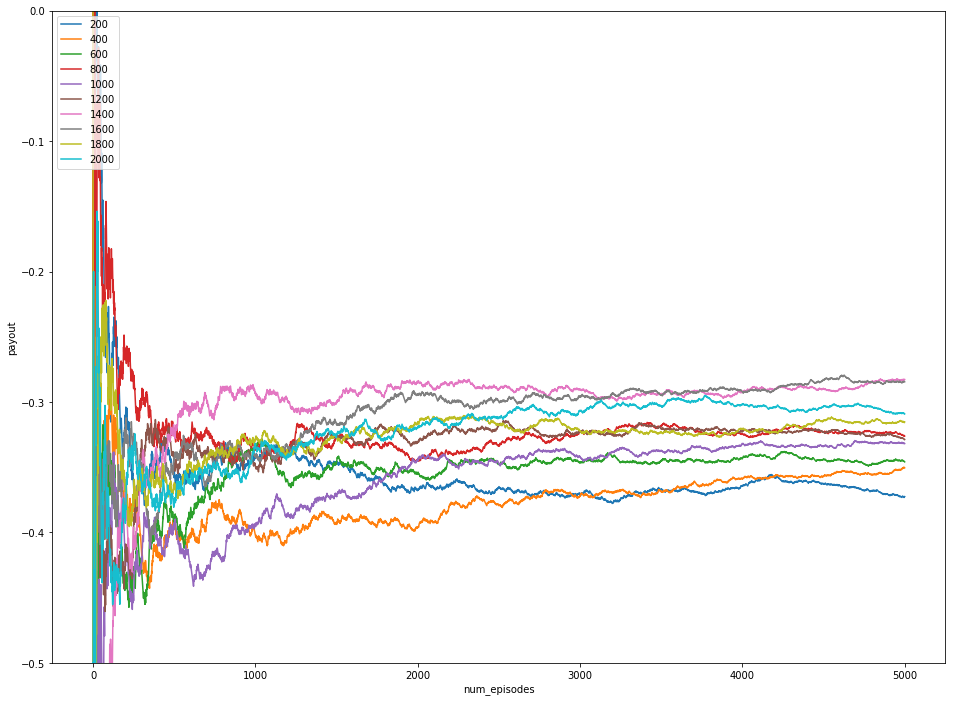

In [9]:
agent1=trainAgent.Train(0.1,0.5,0.9)

In [10]:
BlackJack.gameplay(agent1)

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 4
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 6
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 6
Initial state: {'sta

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [4, 8], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 8}}
Random Init Bet: 4
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [4, 8, 9], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 8}, 'reward': 0, 'is_round_done': False}
Player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [4, 8, 9], 'player_total_balance': 14, 'usable_ace': False}, 'dealer_info': 8}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 14
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 23 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 14
Initial st

player name: gokul money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [8, 4], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [8, 4, 7], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 0, 'is_round_done': False}
Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 29, 'player_card': [8, 4, 7, 10], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 4}, 'reward': -1, 'is_round_done': True}
Balance Left: 6
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 46 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 6
Initial state: {'state': {'player_info': {'player_sum_card': 15, 

Game Number: 58 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 7}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 7}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 58 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [6, 9], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info'

player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 3
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [10, 6, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 2}, 'reward': -1, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 71 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 6
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_ca

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 93 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 5}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 93 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 2
Initia

Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player 

Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player w

Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player

Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match

Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Playe

Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lo

Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player 

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player l

Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player los

Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player los

Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost

Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player 

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lo

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw ma

Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player

Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player los

Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Play

Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost

Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player

Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
D

Player winner
Player winner
Draw match
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Pla

Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player win

Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player

Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw 

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Play

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player

Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player 

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner

Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player wi

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player 

Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner


Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
P

Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player wi

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player los

Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Pla

Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Playe

Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Pl

Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Pl

Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winn

Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
D

Player winner
Player lost
Draw match
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player 

Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Pl

Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player 

Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
P

Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player 

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player 

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Draw match
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player l

Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Pla

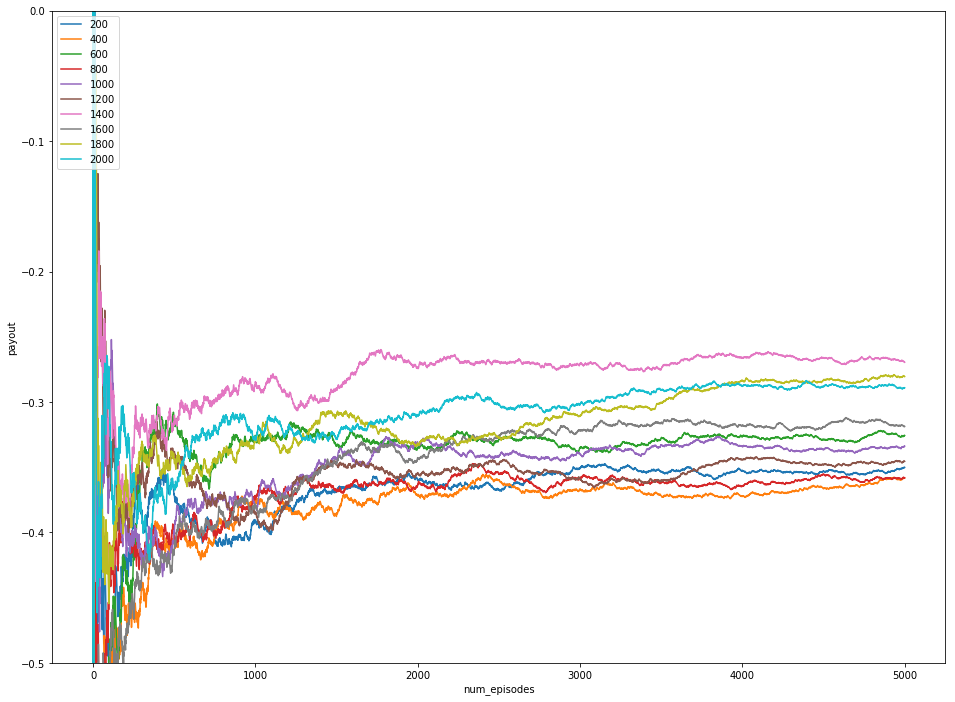

In [11]:
agent2=trainAgent.Train(0.1,0.5,0.8)

In [12]:
BlackJack.gameplay(agent2)

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [7, 7], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 5
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [7, 7], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 15
Initial state: {'sta

Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [1, 5, 2, 10, 9], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 2}, 'reward': -1, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 10 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 10], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 6
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--

Game Number: 16 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [9, 9], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 2
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [9, 9], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 16 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [6, 6], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 1


-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 23 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 15
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 9
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 24, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 24
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 23 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 24
Initial state: {'state': {'player_info':

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 38 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 14
Initial state: {'state': {'player_info': {'player_sum_card': 10, 'player_card': [3, 7], 'player_total_balance': 14, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 10, 'player_card': [3, 7], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 11
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 38 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 11
Initial state: {'state': {'player_info': {'

Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 60 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 61
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 61 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [4, 5], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [4, 5, 1], 'player_total_balance': 9, 'usable_ace': True}, 'dealer_info': 6}, 'reward': 0, 'is_round_done': False}
Pla

Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [5, 4], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 16
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 83 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 16
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [8, 3], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [8, 3, 5], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Player lost
State after nth action: {'state': {'player_info': {'player_sum_card'

Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Playe

Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player 

Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner

Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
P

Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player los

Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Play

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner

Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Dr

Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Pla

Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
P

Player winner
Player lost
Player winner
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner


Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner


Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Pla

Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player wi

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player los

Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Play

Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winn

Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player l

Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player l

Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Pla

Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Play

Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
P

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player los

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lo

Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player

Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player winne

Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player los

Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost

Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player 

Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player los

Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Pla

Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Pla

Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player win

Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Dr

Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player 

Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player wi

Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player win

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Pl

Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player

Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Play

Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Play

Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Draw match
Draw match
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player

Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Pla

Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Draw match
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winn

Player lost
Draw match
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Pl

Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player l

Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player wi

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Pl

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player l

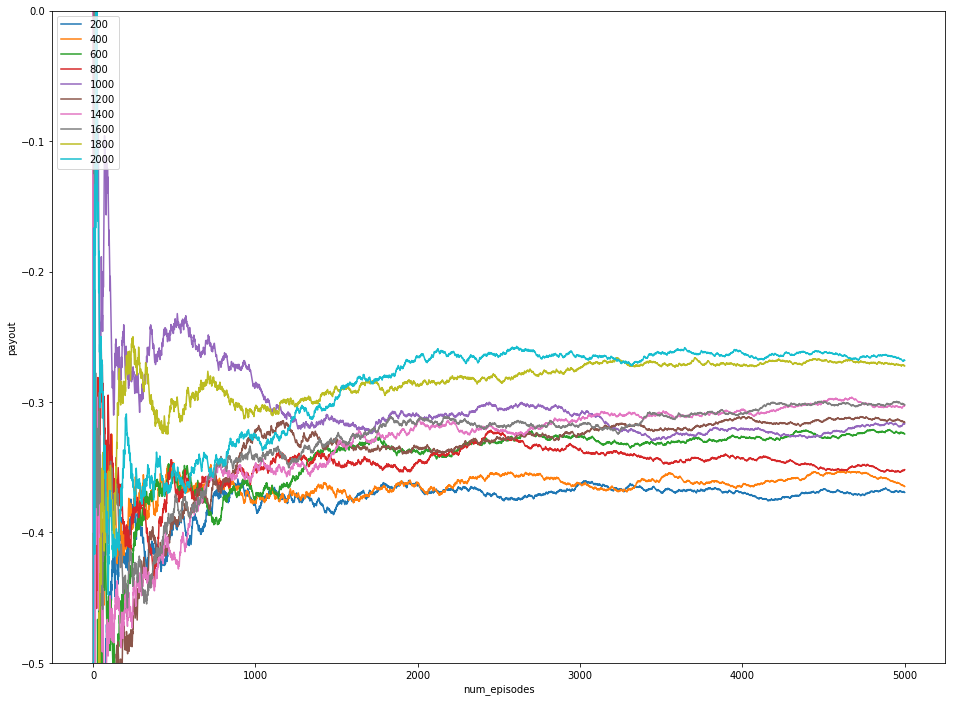

In [13]:
agent3=trainAgent.Train(0.1,0.5,0.8)

In [14]:
BlackJack.gameplay(agent3)

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 6
Action taken: 0
Draw match
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 10
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 15 Round Number: 9
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 4
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 5], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 1
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 25, 'player_card': [10, 5, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 15 Round Number: 10
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 3
Initial state: {'state': {'player_info': {'pl

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 12
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 10], 'player_total_balance': 12, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 8
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [3, 10, 9], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1, 'is_round_done': True}
Balance Left: 4
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 24 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 4
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [2, 6], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'sta

Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [10, 6, 10], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 8}, 'reward': -1, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 39 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 2
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 7}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

State after nth action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 8, 2], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 44 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [6, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 1
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [6, 7], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-

Random Init Bet: 1
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 48 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 49
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 49 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [7, 4], 'player_total_balance': 10, 'usable_ace':

You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 56
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 56 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [4, 7], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 9
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [4, 7, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Draw match
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [4, 7, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 10
Round over
-%--%--%--%--%--%--%--

Initial state: {'state': {'player_info': {'player_sum_card': 7, 'player_card': [4, 3], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 7, 'player_card': [4, 3], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 69 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [9, 8], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 2
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [9, 8], 'player_

Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [5, 9], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [5, 9, 8], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 9
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 79 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 1
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10]

player name: gokul money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 93
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 93 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 5
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 23, 'player_card': [3, 10, 10], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 93 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%

Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 98 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 4], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 2
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 4], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 98 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 1
Initial state: {'stat

Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Draw match
Play

Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player 

Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player

Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player win

Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player 

Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost

Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player

Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player w

Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player w

Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player l

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
D

Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner


Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Pl

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost


Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lo

Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player w

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Draw match
Player winner
Dr

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Draw match
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Play

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lo

Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Pla

Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Play

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner

Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner


Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Pla

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Pl

Draw match
Player lost
Draw match
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
P

Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost

Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player 

Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Draw match
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player win

Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
P

Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Pla

Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
P

Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost

Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player 

Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player

Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Play

Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Draw match
Player lost
Player winner
Draw match
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winn

Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winne

Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost


Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Pl

Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Draw match
Draw match
Player lost

Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Pla

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Pl

Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player 

Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player los

Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player

Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player

Player lost
Draw match
Draw match
Draw match
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player los

Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lo

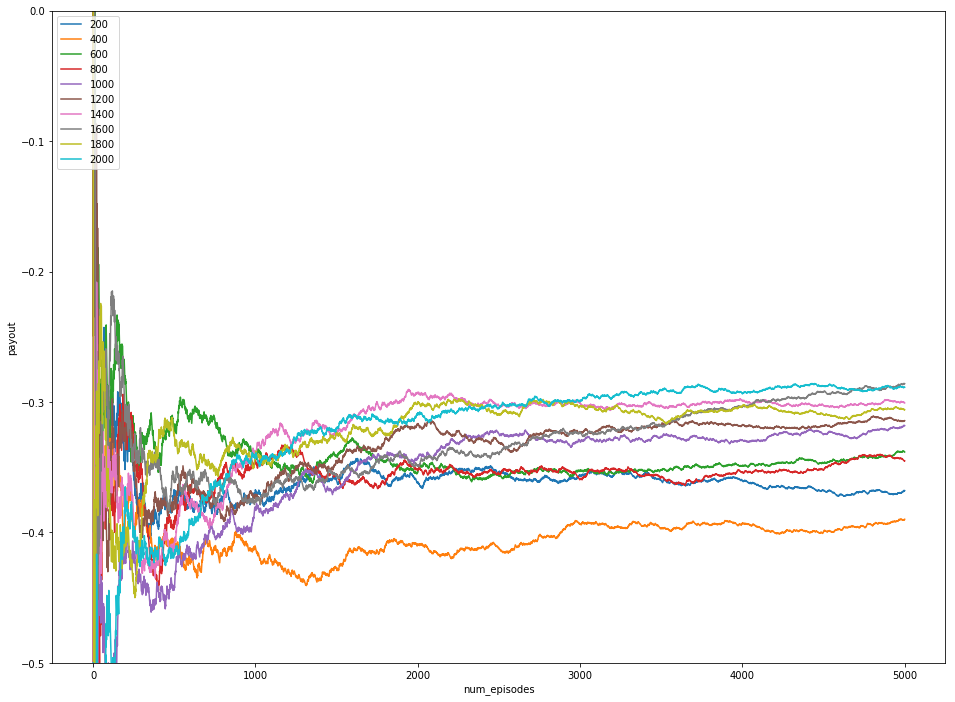

In [15]:
agent4=trainAgent.Train(0.1,0.2,0.8)

In [16]:
BlackJack.gameplay(agent4)

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 1], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 5}}
Random Init Bet: 9
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [1, 1, 9], 'player_total_balance': 1, 'usable_ace': True}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [1, 1, 9, 4], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [1, 1, 9, 4]

Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 5 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [3, 5], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 5
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [3, 5, 7], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [3, 5, 7], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--

Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 24, 'player_card': [2, 3, 9, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 8}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 15 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 16
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 16 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [2, 6], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 2}}
Rando

Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [1, 5], 'player_total_balance': 0, 'usable_ace': True}, 'dealer_info': 3}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 22 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 23
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 23 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [10, 8], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random I

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 4
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 29, 'player_card': [10, 10, 9], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 30 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 6, 'player_card': [2, 4], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'s

Player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 1, 9], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 43 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [7, 5], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [7, 5], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 10
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 50 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 51
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 51 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
pla

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 63 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 1
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [10, 6, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 63 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 2
Initial state: {'state': {'player_info': {'pla

Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 83 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 3
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [5, 10, 7], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 6}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 83 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money

Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player w

Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player 

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost


Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Pl

Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Pla

Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner


Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost


Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost

Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost

Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player l

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw 

Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player los

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Pla

Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player 

Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Pl

Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
P

Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Play

Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Draw match
Draw match
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
P

Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost


Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player

Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner


Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Pl

Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Draw m

Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Draw mat

Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player w

Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner


Player winner
Draw match
Player winner
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player wi

Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Playe

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Play

Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
P

Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Play

Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Playe

Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player 

Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Pl

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player wi

Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player

Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player 

Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Draw match
Player lost
Player 

Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Playe

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Play

Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Draw match
Draw match
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Playe

Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player

Player lost
Player lost
Draw match
Draw match
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lo

Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner

Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Pla

Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Play

Draw match
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost


Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winn

Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Play

Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Play

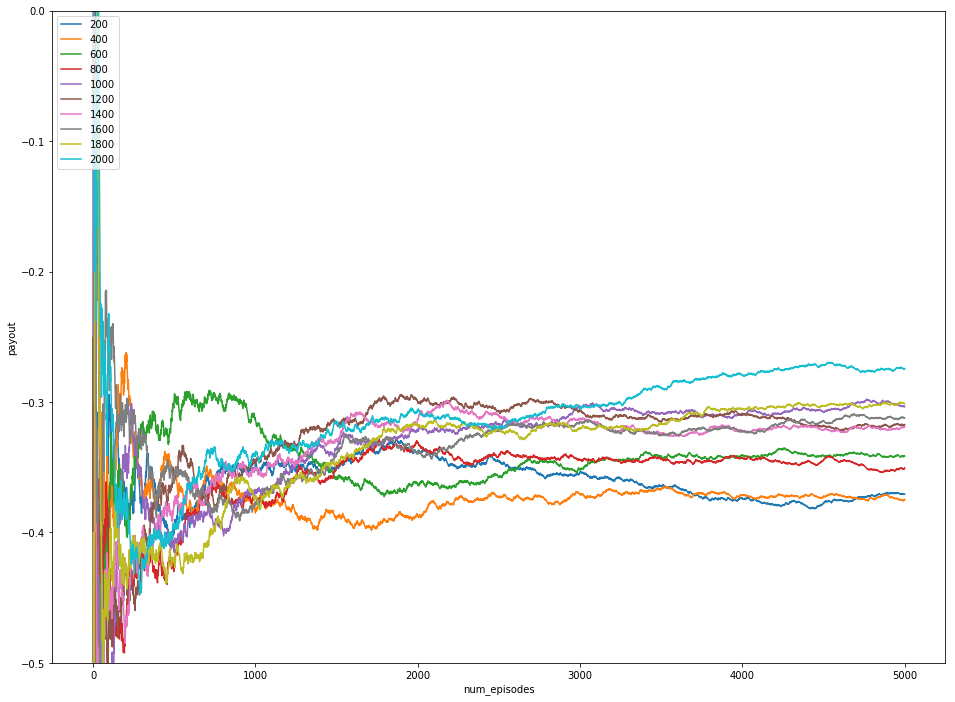

In [21]:
agent5=trainAgent.Train(0.1,0.2,0.8)

In [22]:
BlackJack.gameplay(agent5)

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [10, 2], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 7
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 2, 7], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [10, 2, 7, 8], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-

Game Number: 18 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 18
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [8, 10, 1], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [8, 10, 1], 'player_total_balance': 21, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 21
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 18 Round Number: 9
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player n

Game Number: 31
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 31 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [7, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 9
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [7, 9, 4], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 9}, 'reward': 0, 'is_round_done': False}
Player lost
State after nth action: {'state': {'player_info': {'player_sum_card': 30, 'player_card': [7, 9, 4, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 44 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 26
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [1, 7], 'player_total_balance': 26, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 7
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [1, 7, 8], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
State after nth action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [1, 7, 8, 1], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [1, 7, 8, 1, 4], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Player los

Initial state: {'state': {'player_info': {'player_sum_card': 5, 'player_card': [2, 3], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 5
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 5, 'player_card': [2, 3], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 13
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 60 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 13
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 1
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'pl

Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [3, 1], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [3, 1], 'player_total_balance': 7, 'usable_ace': True}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 82 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [8, 4], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 6
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [8, 4], 'player

Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 96 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [6, 8], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'playe

Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lo

Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Pla

Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match


Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
P

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lo

Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Pl

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player 

Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost


Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
P

Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Playe

Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player winner
D

Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
P

Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player los

Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player w

Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
P

Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player wi

Player lost
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player l

Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Play

Draw match
Player winner
Player lost
Player lost
Player winner
Draw match
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player

Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Playe

Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player los

Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player los

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player winner
Pl

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Play

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Pla

Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Playe

Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Draw match
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Draw match
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Pl

Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Draw match
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lo

Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player win

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Pl

Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Playe

Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player 

Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player winner
Draw match
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player winner
Player lost
Player

Draw match
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player w

Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Playe

Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player los

Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost

Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player winner
Player winner
Draw match
Player lost
Player lost
Player lost
Player lo

Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Draw match


Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Draw match
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player

Player winner
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Playe

Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Draw match
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Pla

Draw match
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Draw match
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Draw match
P

Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lo

Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player

Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Draw match
Draw match
Draw match
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player 

Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Draw match
Player lost
Player lost
Player winner
Player lost
Draw match
Player winner
Player lost
Player winner
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Draw match
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Pla

Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player winner
Player lost
Player lost
Draw match
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player lost


Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player winner
Player winner
Player lost
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Draw match
Player lost
Player winner
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player lost
Player winner
Player lost
Draw match
Player lost
Player lost
Player lost
Player lost
Player winner
Player lost
Player lost
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player lost
Player lost
Player winner
Player winner
Player winner
Player lost
Player lost
Player winner
Player lost
Player winner
Player lost
Player lost
Player lost
Playe

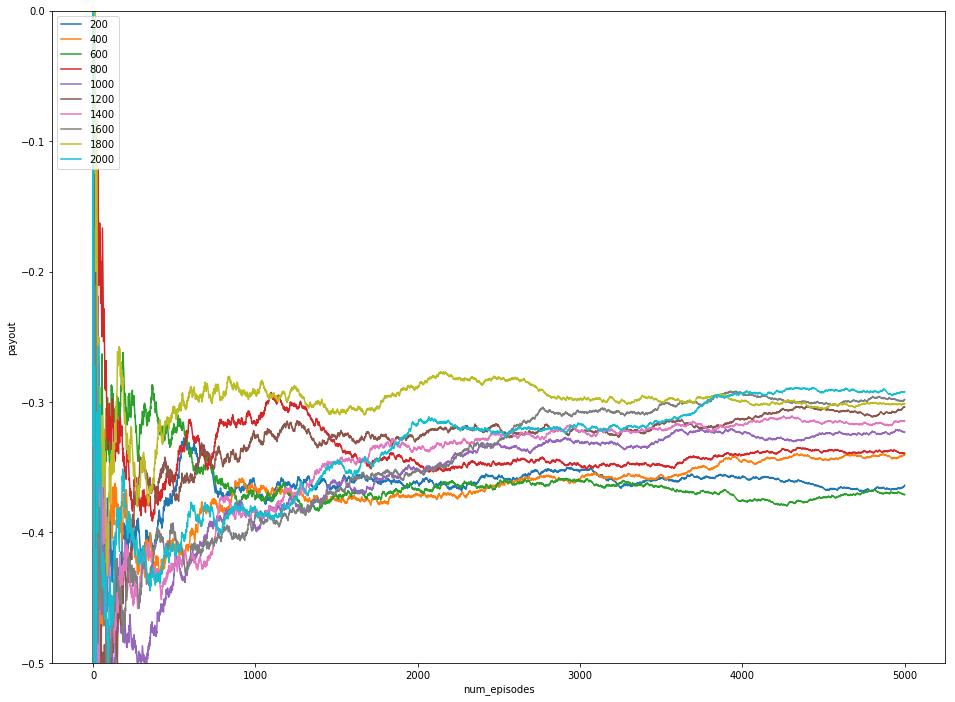

In [23]:
agent6=trainAgent.Train(0.5,0.2,0.8)

In [24]:
BlackJack.gameplay(agent6)

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 8
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 18
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 18
Initial state: {

Player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [7, 2, 4, 7], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 9
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 15 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [6, 1], 'player_total_balance': 9, 'usable_ace': True}, 'dealer_info': 8}}
Random Init Bet: 3
Action taken: 0
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [6, 1], 'player_total_balance': 6, 'usable_ace': True}, 'dealer_info': 8}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 6
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 37 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [9, 3], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [9, 3, 1], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [9, 3, 1, 8], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [9, 3, 1, 8], 'play

State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [5, 6, 9], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 57 Round Number: 10
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [2, 6], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 7
Action taken: 0
Player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [2, 6], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 73 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 7
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 23, 'player_card': [10, 10, 3], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 2}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 73 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 0
You are out of money ! Will go to 

State after 1st action: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [2, 6], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 8}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 94 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: gokul money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 1
Player lost
State after 1st action: {'state': {'player_info': {'player_sum_card': 25, 'player_card': [5, 10, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-

# Experimentation Inference 
        Therefore from the above differnt agents with different parameters, we could conclude that the agent with better Random exploration factor(epsilon), least Learning factor (alpha) and least Discount factor (gamma) provides the best winning outcomes in this BlackJack game. And from the plots we could infer that the number_of_episodes_to_train is proportional to the payout. If number_of_episodes_to_train is more, the greater is the payout.
         

# Conclusion
    Thus the BlackJack game is implemented using Reinforcement Learning Agent instead of a player and this is achieved using Q Learning TD approach.

# Reference
    [1] https://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/Assign4.ipynb#
    [2] https://stats.stackexchange.com/questions/326788/when-to-choose-sarsa-vs-q-learning
    [3] https://medium.freecodecamp.org/an-introduction-to-q-learning-reinforcement-learning-14ac0b4493cc
    [4] https://en.wikipedia.org/wiki/State%E2%80%93action%E2%80%93reward%E2%80%93state%E2%80%93action